In [1]:
import torch

import pandas as pd
import random
import time
from matplotlib import pyplot as plt

import numpy as np
# import scipy

random.seed(time.time())

from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

print(torch.cuda.is_available())

device = torch.device("cuda:0")


True


In [2]:
with open('cleaned_data.txt') as f:
    lines = f.readlines()

CNSMPO = [x.split(",")[2] for x in lines]
CNSMPO.pop(0)
CNSMPO = [float(x) for x in CNSMPO]

with open('vectors.txt') as f:
    vectors = f.readlines()

vectors = [v.split() for v in vectors]

for i, v in enumerate(vectors):
    vectors[i] = [float(x) for x in v]


tempshuffle = list(zip(vectors, CNSMPO))
random.shuffle(tempshuffle)

vectors, CNSMPO = zip(*tempshuffle)

# CNSMPO = [i/6 for i in CNSMPO]

print(len(CNSMPO), CNSMPO[0])

print(vectors[0])

8231 4.661492256880953
[2.9442487, -0.2031604, -4.094362, 8.403363, -1.7098029, 1.6573222, -12.612544, 0.5648541, 5.7817755, 5.30085, -6.5983043, -2.4061704, -6.5787416, -2.324627, -4.4215903, 3.3307295, 5.308748, -2.9855824, -6.2215443, 7.8350005, 2.5803497, 5.819739, 15.532946, 9.175416, -9.741278, -0.42219216, -2.12663, -9.108114, -0.00778717, 0.62596595, 15.382938, -6.4555097, -3.6184654, -6.002512, 3.9772549, 3.1745641, -0.1961249, -0.9495167, 9.240791, 1.8943012, -0.6821304, -0.046196725, -3.0510712, 0.12171599, -14.033541, 3.7387955, -0.678676, 7.471568, -7.0926785, 2.1863465, 8.517438, -8.080292, -3.0488112, -9.439555, -5.322977, -3.2482119, -6.2263217, 0.25025645, 3.8440573, 4.4846745, -0.38114333, -11.038356, -2.377268, 0.71023625, -14.703264, 0.86322355, 11.089104, -1.8979636, -2.3037248, 0.7279553, -6.956133, 4.1397285, 9.536587, -5.3298616, -3.942383, 6.285868, -3.8632197, 7.458221, -2.7900004, -0.7278987, 3.6011443, -0.18325971, -7.1528106, -12.583293, 1.184458, -1.956058

In [3]:
dim_input = len(vectors[0])
dim_output = 1

# Define the model and training parameters #
model = torch.nn.Sequential(
          torch.nn.Linear(dim_input, 256),
          torch.nn.ReLU6(),
          torch.nn.Linear(256, 256),
          torch.nn.ReLU6(),
          torch.nn.Linear(256, 32),
          torch.nn.ReLU6(),
          torch.nn.Linear(32, dim_output),
          torch.nn.ReLU6()
        )
# 1 256 256 layers -> .10 train .146 test
# 2 layers doesn't work
# seems reallllllly tempremental...
# decreasing the layer size increases loss...
# 512 works with 2 layers

model.to(device)
loss_fn = torch.nn.MSELoss(reduction="mean")
num_epochs = 100
lr = 1e-4
# lr_decay = 0.99
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

train_vectors = torch.FloatTensor(vectors[0:8000]).to(device)
test_vectors = torch.FloatTensor(vectors[8001:len(vectors)-1]).to(device)

train_cnsmpo = torch.FloatTensor(CNSMPO[0:8000]).to(device)
test_cnsmpo = torch.FloatTensor(CNSMPO[8001:len(CNSMPO)-1]).to(device)



/home/jaredwg/miniconda3/envs/project1/lib/python3.7/site-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


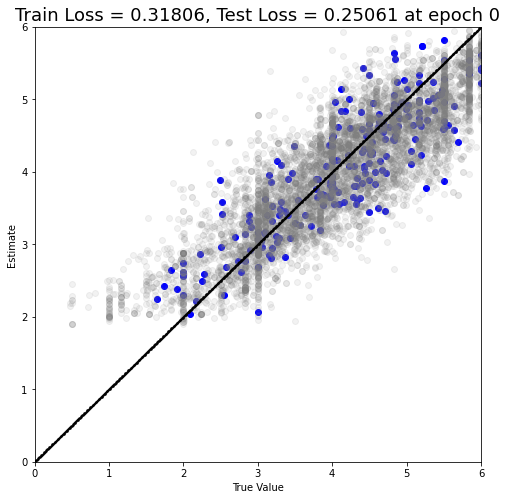

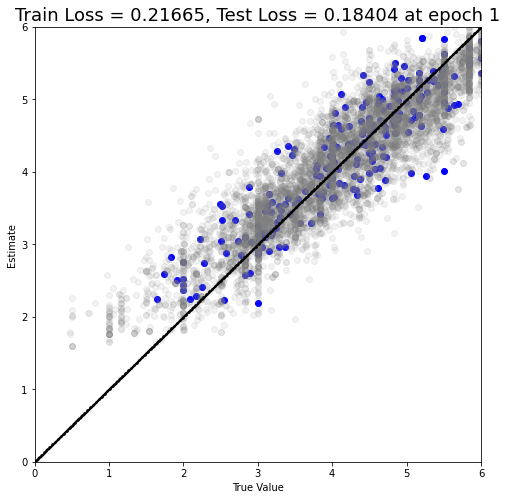

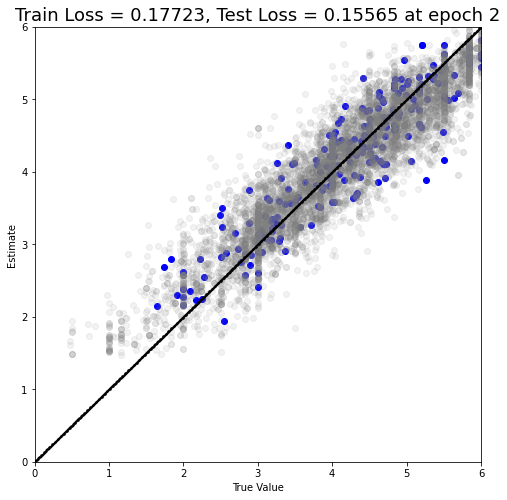

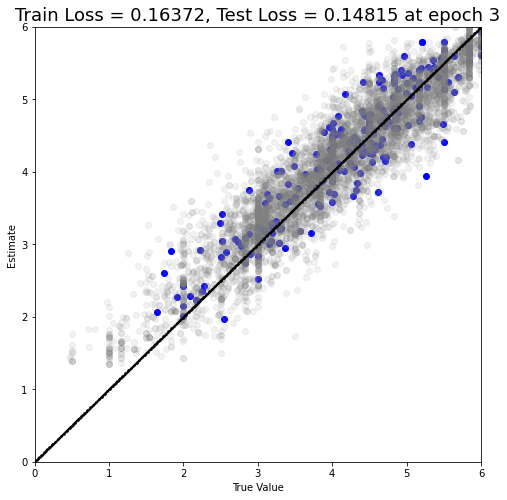

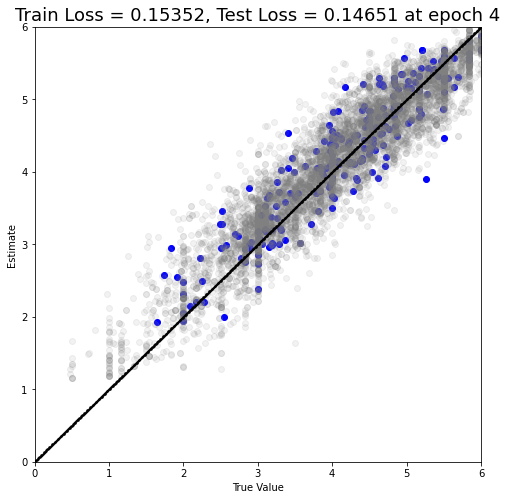

...

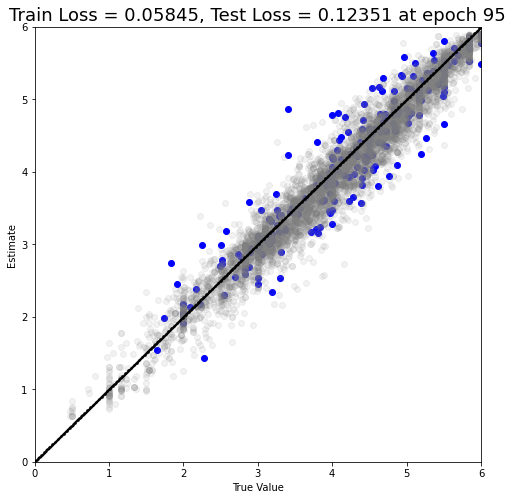

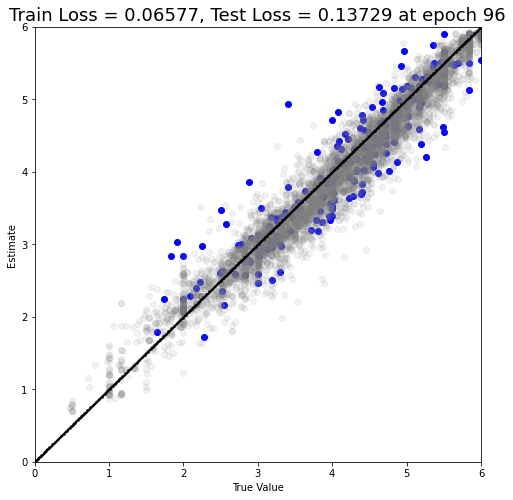

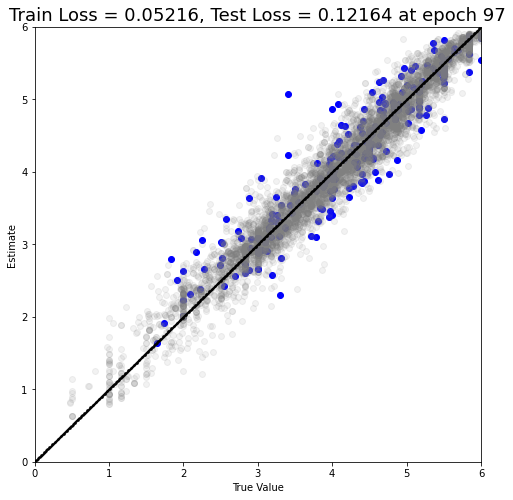

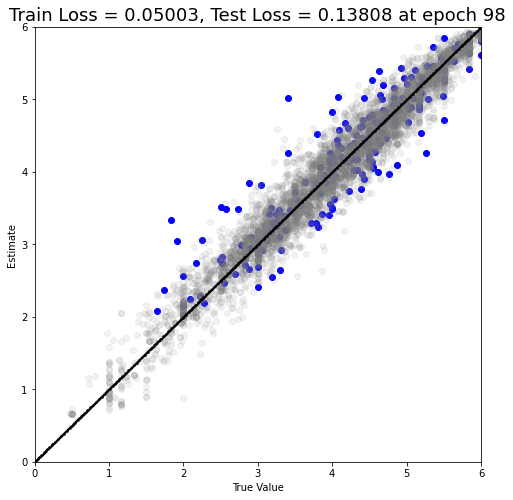

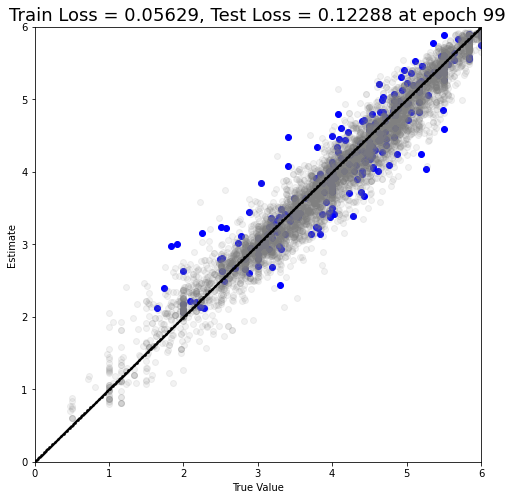

In [4]:
def plotModel():
    model.eval()
    output_train = model(train_vectors)
    trainloss = 0.0
    for j, x in enumerate(output_train):
        x_pred = float(x.cpu().detach().numpy())
        x_real = train_cnsmpo[j].cpu().detach().numpy()
        #print(x_pred)
        #print(x_real)
        trainloss += np.square(x_real - x_pred )
    trainloss = trainloss/len(output_train)
    # print("MSE Train Loss: " + str(trainloss))

    output_test = model(test_vectors)
    testloss = 0.0
    for j, x in enumerate(output_test):
        x_pred = float(x.cpu().detach().numpy())
        x_real = test_cnsmpo[j].cpu().detach().numpy()
        #print(x_pred)
        #print(x_real)
        testloss += np.square(x_real - x_pred )
    testloss = testloss/len(output_test)
    # print("MSE Test Loss: " + str(testloss))

    
    fig, ax = plt.subplots()

    output_test = output_test.cpu().detach().numpy()
    output_test = [float(x) for x in output_test]

    output_train = output_train.cpu().detach().numpy()
    output_train = [float(x) for x in output_train]

    test_cnsmpo_numpy = test_cnsmpo.cpu().detach().numpy()
    train_cnsmpo_numpy = train_cnsmpo.cpu().detach().numpy()

    ax.scatter(test_cnsmpo_numpy, output_test, color="blue")
    ax.scatter(train_cnsmpo_numpy, output_train, color="grey", alpha=0.1)

    fig.set_size_inches(8, 8)

    ax.set_xlabel("True Value")
    ax.set_ylabel("Estimate")
    ax.set_title("Train Loss = " + str(round(trainloss, 5)) +", Test Loss = " + str(round(testloss, 5)) + " at epoch " + str(i), fontsize=18 )
    
    line = np.arange(0, 6, 0.01)

    ax.scatter(line, line, color="black", s=2)
    ax.set_xlim([0, 6])
    ax.set_ylim([0, 6])

    plt.show()


for i in range(num_epochs):
    model.train()
    # loss = loss_fn(pred_cnsmpo, train_cnsmpo)
    loss_total = 0
    for j, v in enumerate(train_vectors):
        pred_cnsmpo = model(v)
        loss = loss_fn(pred_cnsmpo, train_cnsmpo[j])
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loss_total += loss.item()
    
    # print("MSE train loss at epoch " + str(i+1) + ": " + str(loss_total/len(train_vectors)))
    model.eval()
    output = model(test_vectors)
    testloss = 0.0
    for j, x in enumerate(output):
        x_pred = float(x.cpu().detach().numpy())
        x_real = test_cnsmpo[j].cpu().detach().numpy()
        testloss += np.square(x_real - x_pred )
    testloss = testloss/len(output)
    # print("MSE test loss at epoch " + str(i+1) + ": " + str(testloss))
    # print("-"*20)
    plotModel()
    model.train()
     
    #optimizer.zero_grad()
    #loss.backward()
    #optimizer.step()
    
    
    

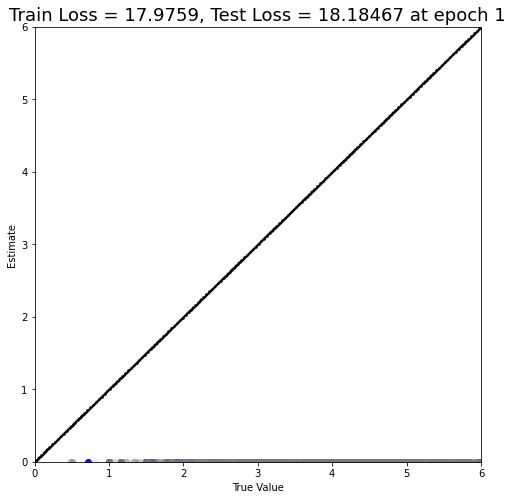

In [53]:
plotModel()

In [5]:
torch.save(model.state_dict(), "Pytorch-Models/cnsmpo-model/cnsmpo_model.pt")

In [ ]:
"""

model = torch.nn.Sequential(
          torch.nn.Linear(dim_input, 256),
          torch.nn.ReLU6(),
          torch.nn.Linear(256, 256),
          torch.nn.ReLU6(),
          torch.nn.Linear(256, 32),
          torch.nn.ReLU6(),
          torch.nn.Linear(32, dim_output),
          torch.nn.ReLU6()
        )

"""